# Installations & Imports:

In [0]:
!pip install gmplot
import random
import pandas as pd
from gmplot import gmplot
from matplotlib import pyplot as plt
import matplotlib as mp
import collections as col
import numpy as np
import datetime
from math import *
import sklearn as sk
from sklearn import neural_network
from sklearn import preprocessing
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers


from __future__ import print_function
import os

In [0]:
!wget https://www.dropbox.com/s/1y28nsi38uh8v40/task-data.csv

--2019-01-22 19:09:20--  https://www.dropbox.com/s/1y28nsi38uh8v40/task-data.csv
Resolving www.dropbox.com (www.dropbox.com)... 162.125.8.1, 2620:100:6018:1::a27d:301
Connecting to www.dropbox.com (www.dropbox.com)|162.125.8.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/1y28nsi38uh8v40/task-data.csv [following]
--2019-01-22 19:09:20--  https://www.dropbox.com/s/raw/1y28nsi38uh8v40/task-data.csv
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc9f2cee57c3e69b2518501992c8.dl.dropboxusercontent.com/cd/0/inline/AZ5QtPvSoi-e0I2_OtJUJeWfZcDhS4DN5E1MV2qukLS1U4kR0wo2HfBLd7AGDTb-5VJhlPVJ9QNHBecwbtNScbwn01ZdHow3x1gW85waAEjBkbbR0H4QqkI4ww_EKjkeRUIdfUJVAXwXCPugRw0mgDw6xb6tTcum42ma1jiArS8YdkVeR9pEQdwgh8BOQfEjaCc/file# [following]
--2019-01-22 19:09:20--  https://uc9f2cee57c3e69b2518501992c8.dl.dropboxusercontent.com/cd/0/inline/AZ5QtPvSoi-e0I2_OtJUJeWfZcDhS4DN5E1MV2qukLS1U4k

# Data Exploration & Visualization:

In [0]:
#@title Exploration & preprocessing  (double click to view the code) { form-width: "15%" }
# id	timestamp	supplier	longitude	latitude
Data = pd.read_csv('task-data.csv', dtype={'supplier':str})
Data_backup = pd.read_csv('task-data.csv', dtype={'supplier':str})


print (Data[0:3])                                     #take a look at what the data looks like
print ("\nOriginal data size: " + str(len(Data)))   #Data set size = 299985
# shift=12.75
shift=0

#Data claning
Data_clean = Data.dropna()                                       # Drop NaNs
Data_clean = Data_clean.reset_index(drop=True)                   #60 data points dropped
print (str(len(Data)-len(Data_clean))+" NaN Data ponts dropped.")
Data = Data_clean                                                # get rid of original data, only keeping the cleaned dataset.
print ("Clean data size: " + str(len(Data))+"\n")                # 299925

Data['timestamp'] = pd.to_datetime(Data['timestamp'])            # Convert the timestamps from str to type datetime
Data['date'] = Data['timestamp'].dt.date                         # Create a column for date only
Data['time'] = Data['timestamp'].dt.time                         # Create a column for time only
Data['day'] = Data['timestamp'].dt.day                           # Create a column for day of the month only
Data['weekday'] = Data['timestamp'].dt.weekday                   # Create a column for day of the week only
Data['dayhours'] = Data['timestamp'].dt.hour                     # Create a column for hour of the day only


Data = Data.sort_values(by=['timestamp'])                      # Sort the data by date, for ease of thresholding by time, later.
Data = Data.reset_index(drop=True)
t2019 = datetime.date(2019, 1, 1)
Data = Data[Data['date'] < t2019]                                # Drop 11 data points in 2019, to make the dataset only in june 2018.
print ("Additional "+str(299925-len(Data))+" Data ponts from 2019 dropped.\nNow we have all the daata in June 2018")


lat = Data['latitude'].values             #put latitude data in a numpy array called lat
long= Data['longitude'].values+shift      #put longitude data in a numpy array called long
supp= Data['supplier'].values
tsmp= Data['timestamp']

print ("First order at:  " + str(min(Data['timestamp'])))
print ("Last order at :  " + str(max(Data['timestamp']))+"\n")


lat_max = max(Data['latitude'])
lat_min = min(Data['latitude'])
long_max = max(Data['longitude'])+shift
long_min = min(Data['longitude'])+shift


print ("Latitude Max:  " + str(lat_max))
print ("Latitude Min:  " + str(lat_min))
print ("Longitude Max: " + str(long_max))
print ("Longitude Min: " + str(long_min)+"\n")

lat_mid= (lat_max+lat_min)/2
long_mid= (long_max+long_min)/2
print ("Latitude Mid:  " + str(lat_mid))
print ("Longitude Mid: " + str(long_mid)+'\n')

lat_mean = lat.mean()
long_mean = long.mean()
print ("Latitude Mean:  " + str(lat_mean))
print ("Longitude Mean: " + str(long_mean))


Data.describe()      # A summary of the data statistics


           id                   timestamp supplier  longitude   latitude
0  SA00231337  2018-06-26 10:25:28.876204   1280.0  34.116374  24.725567
1  SA00243891  2018-06-27 10:06:11.923351     40.0  34.099649  24.762035
2  SA00093623  2018-06-12 23:05:27.131637   6160.0  33.947576  24.813266

Original data size: 299985
60 NaN Data ponts dropped.
Clean data size: 299925

Additional 11 Data ponts from 2019 dropped.
Now we have all the daata in June 2018
First order at:  2018-06-01 00:01:47.815082
Last order at :  2018-06-30 18:55:32.036688

Latitude Max:  24.9290295701
Latitude Min:  24.5354515701
Longitude Max: 34.1829956582
Longitude Min: 33.7997876582

Latitude Mid:  24.7322405701
Longitude Mid: 33.9913916582

Latitude Mean:  24.703268132221318
Longitude Mean: 34.005789033110176


,longitude,latitude,day,weekday,dayhours
count,299914.000000,299914.000000,299914.000000,299914.000000,299914.000000
mean,34.005789,24.703268,17.152117,3.117680,18.167058
std,0.076934,0.088672,8.692947,1.907061,4.078603
min,33.799788,24.535452,1.000000,0.000000,0.000000
25%,33.949443,24.600043,10.000000,2.000000,16.000000
50%,33.999301,24.725567,18.000000,3.000000,19.000000
75%,34.078400,24.779887,25.000000,5.000000,21.000000
max,34.182996,24.929030,30.000000,6.000000,23.000000


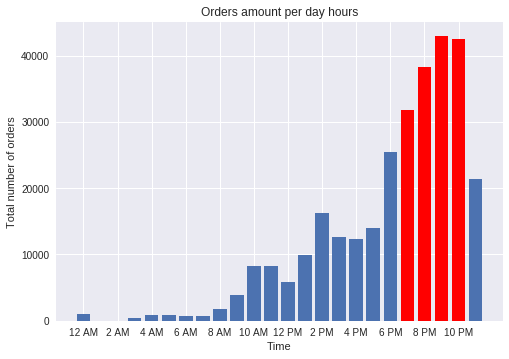

In [0]:
#@title Orders amount per day hours (double click to view the code)
hour_24=range(0,24,2)                            # Make the list for the graphs X-axis ticks, with only even hours shown.
hour_12=[]
for c in hour_24:
  if (c==0):
    hour_12.append("12 AM")
  elif c<12:
    hour_12.append(str(c)+" AM")
  elif(c==12):
    hour_12.append("12 PM")
  else:
    hour_12.append(str(c-12)+" PM")

cc=col.Counter(Data['dayhours'])                                       # Count the number of orders for each day hour by counting the repitions
z = dict(cc)
weekdayDF= pd.DataFrame(z.items(), columns =['dayhours','count'])      # Make a dataframe containing the the days and the number of orders for each
A=weekdayDF['dayhours']
B=weekdayDF['count']

# Plot Days' orders
plt.bar(A, B)
plt.xticks(hour_24, hour_12)
plt.title('Orders amount per day hours')
plt.xlabel("Time")
plt.ylabel("Total number of orders")
plt.bar(A[B>30000], B[B>30000], color = 'red')
plt.show()



---


* **A month has 4 full weeks, and 2 or 3 extra days.** Looking at our dataset, which represent June, a 30-days month, we can see that we have 4 full weeks, and en extra Friday and Saturday.
* When trying to represent the total amount of orders per weekdays, we need to wither take the average of each weekday, or simply just remove the extra 2 days, to have 4 full weeks, and hence have ann accurate comparasion.
* For the following  the orders per weekday, the first 2 days were taken out of consideration, and 4 full weeks, starting at sunday are considered.

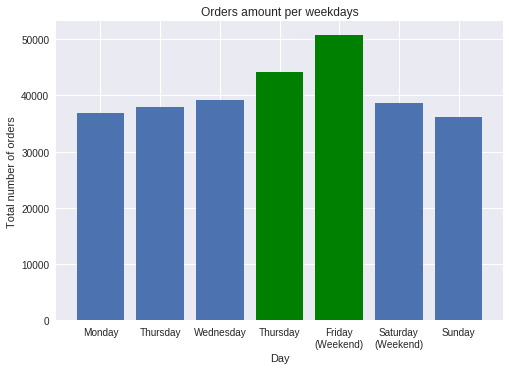

In [0]:
#@title Orders amount per weekdays (double click to view the code)

day_code=[6, 0, 1, 2, 3, 4, 5]
day_name=['Sunday', 'Monday', 'Thursday', 'Wednesday', 'Thursday', 'Friday\n(Weekend)', 'Saturday\n(Weekend)']

t2_6 = datetime.date(2018, 6, 2)
cc=col.Counter(Data[Data['date'] > t2_6]['weekday'])                  # Count the number of orders for each week day by counting the repition
z = dict(cc)
weekdayDF= pd.DataFrame(z.items(), columns =['weekday','count'])      # Make a dataframe containing the the days and the number of orders for each

A=weekdayDF['weekday']
B=weekdayDF['count']

# Plot Days' orders
plt.bar(A, B)
plt.xticks(day_code, day_name)
plt.title('Orders amount per weekdays')
plt.xlabel("Day")
plt.ylabel("Total number of orders")
plt.bar(A[B>40000], B[B>40000], color = 'green')
plt.show()

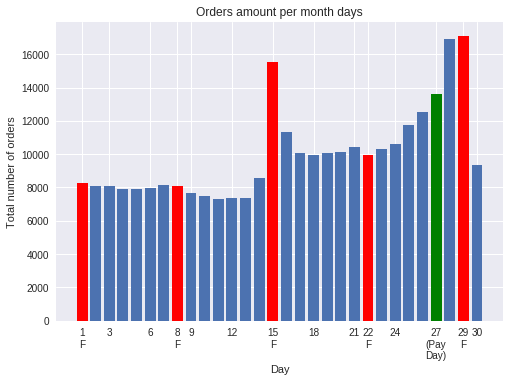

In [0]:
#@title Orders amount per monthdays  (double click to view the code)
day_num=range(3,31,3)
day_num.append(1)
day_num.append(8)
day_num.append(22)
day_num.append(29)
day_txt =[]
for d in day_num:
  if d == 27:
    day_txt.append("27\n(Pay\nDay)")
  elif d%7==1:
    day_txt.append(str(d)+"\nF")
  else:
      day_txt.append(d)

F_days=[1,8,15,22,29]
F_txt=['F','F','F','F','F']
      
cc=col.Counter(Data['day'])                                       # Count the number of orders for each week day by counting the repition
z = dict(cc)
monthdayDF= pd.DataFrame(z.items(), columns =['day','count'])      # Make a dataframe containing the the days and the corresponding number of orders
A = monthdayDF['day']
B = monthdayDF['count']
# C = monthdayDF['da']
C = monthdayDF[monthdayDF['day']%7 == 1]        

# Plot Days' orders
plt.bar(A, B)
plt.xticks(day_num, day_txt)
plt.title('Orders amount per month days')
plt.xlabel("Day")
plt.ylabel("Total number of orders")
plt.bar(A[B==13600], B[B==13600], color = 'green')
plt.bar(C['day'], C['count'], color = 'red')
# plt.xticks(F_days, F_txt)
plt.show()

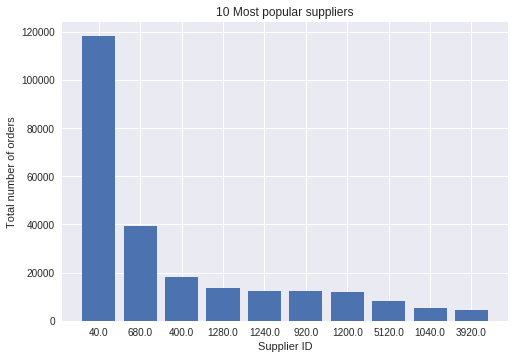

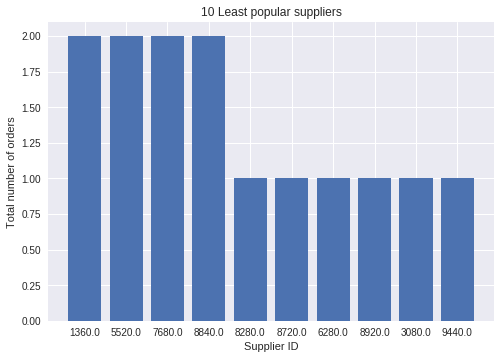

In [0]:
#@title Most and Least popular suppliers  (double click to view the code)

cc=col.Counter(supp)                                             # Count the number of orders for each supplier by counting the repition
z = dict(cc)
suppDF= pd.DataFrame(z.items(), columns =['supplier','count'])   # Make a dataframe containing the suppliers and the number of orders for each
suppDF = suppDF.sort_values(by=['count'], ascending=False)       # Sort the dataframe by #of orders
A=suppDF['supplier']
B=suppDF['count']
idx = np.arange(len(A))
i=10            # Number of suppliers to show

# Plot Top suppliers
plt.bar(idx[0:i], B[0:i])
plt.xticks(idx[0:i], A[0:i])
plt.title('10 Most popular suppliers')
plt.xlabel("Supplier ID")
plt.ylabel("Total number of orders")
plt.show()

# Plot Least popular suppliers
plt.bar(idx[-i:], B[-i:])
plt.xticks(idx[-i:], A[-i:])
plt.title('10 Least popular suppliers')
plt.xlabel("Supplier ID")
plt.ylabel("Total number of orders")
plt.show()

#Lattitude & Longitude calculatons:


**Lattitude** is an angle (defined below) which ranges from 0° at the Equator to 90° North or South (N/S) at the poles. Lattitude lines are all parallel, so the distance between two lines is constant, regardless of where it is measured.
*   Each lattitude degree on the DMS scale (degrees-minutes-seconds) = 111.32 km N/S
*   Converting that to decimal, **1 DMS degree = 1 decimal degree = 111.32 km N/S**
*   So each 0.01 decimal degree = 1.1132 km N/S , and 1km N/S = 0.0089831117499 decimal degrees, which will bw approximated to **1 km N/S = 0.009**  decimal degrees for simplicity.

**Longitude** lines are calles Meridians (lines running from pole to pole) connect points with the same longitude.  Longitude degrees range between 0° at the Prime Meridian (passing through Greenwich, Englan) to +180° eastward and −180° westward.
Longitude lines are not parallel, as the distance between 2 Meridians varies from it's maximum at the equator, to zero at the poles.
*   Each longitude degree on the DMS scale (degrees-minutes-seconds) = 111.32 km E/W at the equator
*   Te prevous value changes as we move north or soutth of the equator, and becomes a fraction of its value at the equator, = cosine (latitude in decimal degrees) * 111.32 km E/W.
*   At lattitude 24.75 degrees decimal (around the midpoint of the lattitude of our dataset),  the factor = cos(24.7) = 0.908.
*   So, **1 longitude decimal degree = (0.908) x111.32 km E/W = 101.09449811 km E/W**
*   So each **0.01 decimal degree = 0.01010945 km E/W**. Because we're working on an area with a relatively small size, the earth curveture is pretty negligible, and we can safely assume that the Meridians are perfectly parallel for that area,  so the distance between two lines is constant, regardless of where it is measured.

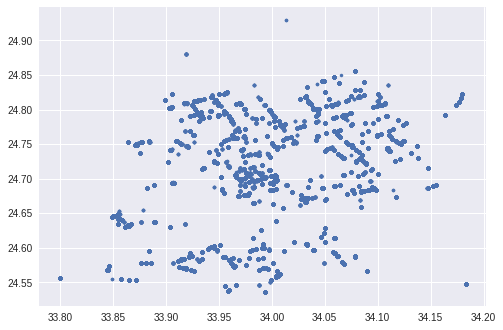

In [0]:
#Define the step side (1km) in decimal coordinates.
LAT_STEP = 0.009             # Decimal latitudinal degrees per Km
LONG_STEP = 0.01010945       # Decimal longitudinal degrees per Km

# Plot all the ordrs locations, to see how they are distributed
plt.plot(long, lat, '.')
plt.show()

In [0]:
print (Data_backup[Data_backup['latitude'] > 24.9])     #Show the extreme point to the north it from the backup dataframe
print

# We can see than there are only 2 orders at a point away from the main clustures,...
# and since we have squares of area 1km-by-1km, these 2 data points will be removed,...
# due to the insignificance, and to avoid having many squares with no orders at all.


# Remove the distant 2 points
Data = Data[Data['latitude'] < 24.9]

Data = Data.reset_index(drop=True)          #reassign the DataFrame indixes


# Recalculate the data & Statstics:

lat = Data['latitude'].values             #put latitude data in a numpy array called lat
long= Data['longitude'].values+shift      #put longitude data in a numpy array called long
supp= Data['supplier'].values
tsmp= Data['timestamp']

lat_max = max(Data['latitude']);          print ("Latitude Max:  " + str(lat_max))
lat_min = min(Data['latitude']);          print ("Latitude Min:  " + str(lat_min))
long_max = max(Data['longitude'])+shift;  print ("Longitude Max: " + str(long_max))
long_min = min(Data['longitude'])+shift;  print ("Longitude Min: " + str(long_min)+"\n")

# The Max lattitude should change.

lat_mid= (lat_max+lat_min)/2
long_mid= (long_max+long_min)/2
print ("Latitude Mid:  " + str(lat_mid))
print ("Longitude Mid: " + str(long_mid)+'\n')

lat_mean = lat.mean()
long_mean = long.mean()
print ("Latitude Mean:  " + str(lat_mean))
print ("Longitude Mean: " + str(long_mean)+"\n")

N_S_distance = (lat_max-lat_min)/LAT_STEP
E_W_distance = (long_max-long_min)/LONG_STEP

print ("Total N/S distance:  " + str(N_S_distance)+" Km")
print ("Total E/W distance:  " + str(E_W_distance)+" Km\n")

print ("Total Number 1Km-by-1km block: " + str(int(ceil(N_S_distance)*ceil(E_W_distance)))+" blocks \n")


Data.describe()      # A summary of the data statistics

                id                   timestamp supplier  longitude  latitude
134364  SA00253745  2018-06-27 21:02:30.358588   8240.0  34.013769  24.92903
223347  SA00211375  2018-06-24 15:32:45.190489   8240.0  34.013769  24.92903
Latitude Max:  24.8796905701
Latitude Min:  24.5354515701
Longitude Max: 34.1829956582
Longitude Min: 33.7997876582

Latitude Mid:  24.7075710701
Longitude Mid: 33.9913916582

Latitude Mean:  24.703266626703446
Longitude Mean: 34.00578897989706

Total N/S distance:  38.2487777778 Km
Total E/W distance:  37.9059197088 Km

Total Number 1Km-by-1km block: 1482 blocks 



,longitude,latitude,day,weekday,dayhours
count,299912.000000,299912.000000,299912.000000,299912.000000,299912.000000
mean,34.005789,24.703267,17.152061,3.117675,18.167059
std,0.076934,0.088671,8.692949,1.907059,4.078609
min,33.799788,24.535452,1.000000,0.000000,0.000000
25%,33.949443,24.600043,10.000000,2.000000,16.000000
50%,33.999301,24.725567,18.000000,3.000000,19.000000
75%,34.078400,24.779887,25.000000,5.000000,21.000000
max,34.182996,24.879691,30.000000,6.000000,23.000000


#Making Blocks of 1 Km area :

**A Function that gives the block number:**
To calculate which block any coordinates pair belongs to, we assume the points **lat_min** and **long_min** to  be the point of origin, and find the vertical and horizontal distances from that cordiinates pair to the origin, and then decide to which block it belongs, dependin on those distances.
* The first block (starting at #1) is consideded to be the one extending 1km North and East of the origin.

In [0]:
#@title Function:  get_Block( lat, long )  (double click to view the code)

def get_Block(lat, long, lat_min=24.5354515701 , long_min=33.7997876582, side=1):
  
#   y_blocks = ceil((lat_max-lat_min)/ LAT_STEP/side)      # Calculate the total number of verticl blocks
  x_blocks = ceil((long_max-long_min)/ LONG_STEP/side)   # Calculate the total number of horizontal blocks
  
  latD  = int((lat - lat_min)/LAT_STEP)                  # Find the vertical distance, rounded down
  longD = int((long- long_min)/LONG_STEP)+1              # Find the horizontal distance, rounded up
    
  block_num= int(longD+(latD*x_blocks))         # Calculate the block number by multiplying the rounded down vertical position by...
                                                # the number of horizontal blocks (counts the total # of block at lower horizontal levels)...
                                                # then add the horizontal distance.
  latC = (latD  + 0.5)*LAT_STEP+lat_min
  longC= (longD - 0.5)*LONG_STEP+long_min
  return block_num #,  latC,  longC

# Verfication of the function
print (get_Block(lat_max, long_max))    #should give the maximim, 1482
print (get_Block(lat_min, long_min))    #should give the minimum, 1
print (get_Block(lat_mid, long_mid))    #should give the median,  1721
print (get_Block(lat_max, long_min))    #should give the max-37,  1445
print (get_Block(lat_min, long_max))    #The end of the first row, 38

1482
1
741
1445
38




---

**Centroids function** :This is a function , given the block number and amount of orders, gives back an array containing the coordinates of the center of that block, the total amount of orders of that block, and the horizontal and vertical distances from the origin in Km, the block number, and the amounf of orders for that block.

In [0]:
#@title Function: get_Centroid( block# ). (double click to view the code)

# This is a function , given th a block number, gives back the coordinates of the .....
# center of that block, the total amunt of orders of that block, and the horizontal and 

def get_Centroid(block,num,lat_min=24.5354515701, long_min=33.7997876582, side=1):
  
  y_blocks = ceil((lat_max-lat_min)/ LAT_STEP/side)      # Calculate the total number of verticl blocks
  x_blocks = ceil((long_max-long_min)/ LONG_STEP/side)   # Calculate the total number of horizontal blocks
  
  latD = ceil(block/x_blocks)-1
  longD = (block - ((latD)*x_blocks))-1
    
  
  latC = (latD  + 0.5)*LAT_STEP+lat_min
  longC= (longD + 0.5)*LONG_STEP+long_min
  return latC,  longC, num, block, latD, longD

In [0]:
# Computing the block numbers for all the data point sin the data set:

blockNum = [get_Block(Data[i:i+1]['latitude'].values[0],Data[i:i+1]['longitude'].values[0]) for i in range(len(Data))]
Data['block']= pd.DataFrame(blockNum)


---
**The following graphs show the nwely created blocks.**
* The first one shows a heatmap for the blocks, depending on the total amount of orders.
* The second one shows the locations of the blocks vs the of the actual locations of orders.

the number of blocks with non-zero amount of orders: 307


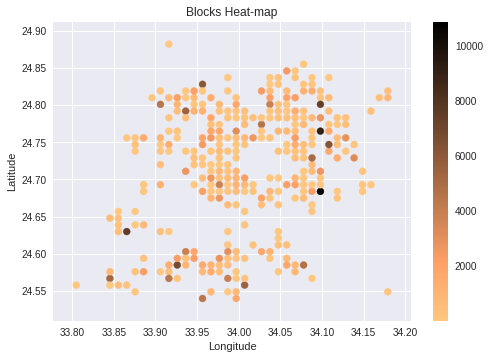

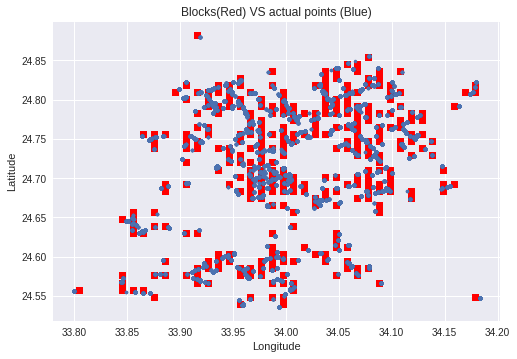

In [0]:
#@title Visualizing the 1Km-by-1Km blocks we just made: (double click to view the code)
cccc=col.Counter(blockNum)      # Counting the number of orders for each block
blocksDict = dict(cccc)
print ("the number of blocks with non-zero amount of orders: " + str(len(blocksDict)))


# Creatin g Dataframe containng information about the blocks from the centroids function
blocks_tuples = [get_Centroid(i,blocksDict[i]) for i in blockNum]
blocksDF = pd.DataFrame(list(blocks_tuples), columns=['Cetroid_lat','Cetroid_long','total', 'block', 'latD', 'longD']).drop_duplicates()

# The following is a plot of a map for the blocks with non-zero amount of orders.
fig, ax1 = plt.subplots()
sctr = ax1.scatter(x=blocksDF['Cetroid_long'], y=blocksDF['Cetroid_lat'], c=blocksDF['total'], cmap='copper_r')
plt.colorbar(sctr, ax=ax1, format='%d')
plt.title('Blocks Heat-map')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


# (in Red) and the actual location of orders (in blue)
plt.plot(blocksDF['Cetroid_long'], blocksDF['Cetroid_lat'], 's', color='red')
plt.plot(long, lat, '.')
plt.title('Blocks(Red) VS actual points (Blue)')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# Building a Predictive Model :

##Create a convenient data set
**New Datasets are going to be built for this purpose**
* The new Datasets groups the orders of each block per hour.

---

1.  The 1st created Dataset consosts of 4 columns , ***block***:  the block number, ***count***: the number of orders at that block at that hour, ***dayhours***: the hour of the day for this group of orders, ***day***: the date of that day of the month, and ***weekday***.
2.   The 2nd one adds also the count for preveous hours is added as ***prev#***.
3.   The 3rd one deals with the data in a diiferent way. Foe each hour, it lists the preveously mentioned features for every one of the 307 blocks with total non-zero orders, regardless of weathe there aoders from that block at that hour or not. So, we have **307** blocks x **24** hours/day x **30** days = 221040 data points.

---

**Note:**
There many other ways to represent the data. one possible way is by representing it as a time series, wit each instance representing a point at the time line. We can easily combine the data we have based on the day and hour.





###1st features set
This Dataset consosts of 4 columns , block: the block number, count: the number of orders at that block at that hour, dayhours: the hour of the day for this group of orders, day: the date of that day of the month, and weekday.

The models performance on this dataset, is not that good, due to the gaps of hours with no orders, which are nor represented in the data, affecting the model's ability to interpolate properly.

In [0]:
#@title 1st features set code
# MainDF = pd.DataFrame([(-1,-1,-1,-1,-1)], columns =['block','dayhours','day','count','weekday'])   # Initialize a DataFrame with a dummy row


# for day in range (1,31):
#   temp = Data[Data['day'] == day]
#   counter = col.Counter(temp[temp['dayhours'] == 0]['block'])
#   print ("Day:"+str(day)+",   total: "+ str(len(temp)))

#   grouped =temp.groupby('dayhours')

#   for name,group in grouped:
#       # print ("Hour: "+ str(name)+"   Day: "+str(group['day'][0:1].values[0]))
#       # print group
#       cou = dict( col.Counter(group['block'] ))
#       tempList = [(group['dayhours'][0:1].values[0], group['day'][0:1].values[0],group['weekday'][0:1].values[0] ) for i in range(len(cou))]
#       tempDF = pd.DataFrame(tempList, columns =['dayhours','day','weekday'])
#       tempDF2 = pd.DataFrame(cou.items(), columns =['block','count'])
#       tempDF['block']= tempDF2['block']
#       tempDF['count']= tempDF2['count']
#       MainDF = MainDF.append(tempDF, ignore_index=True)

      
# MainDF = MainDF.drop([0], axis=0)      # Remove the dummy row


# # To confirm out newly senthesized data is corrcet, compare the total number of...
# # orders with the length of the original data set.
# print ("\ndifference between # of rderes = "+str(MainDF['count'].sum()-len(Data)))
# if (MainDF['count'].sum()-len(Data))==0:
#   print ("PASSED")
# else:
#   print ("FAILED")
  

# MainDF    

###2nd Features set
This Dataset adds also the count for preveous hours is added as prev#. This gives the model the ability to find a correlation between the current data points and the preveous ones, and hence, a better predictive performance as well.

In [0]:
#@title 2nd Features set code
# Dummy = pd.DataFrame([(-1,-1,-1,-1,-1,-1,-1,-1,-1)], columns =['block','dayhours','day','count','weekday', 'prev','prev2','prev3','prev4'])   
# MainDF2 = Dummy        # Initialize a DataFrame with a dummy row

# for day in range (1,31):
#   temp = Data[Data['day'] == day]
#   counter = col.Counter(temp[temp['dayhours'] == 0]['block'])
#   print ("Day:"+str(day),",   total: "+ str(len(temp)))

#   grouped =temp.groupby('dayhours')
  
#   prevC = col.Counter(Dummy['block'])
#   prev2C= col.Counter(Dummy['block'])
#   prev3C= col.Counter(Dummy['block'])
#   prev4C= col.Counter(Dummy['block'])
  
  
# #   for hour,group in grouped:
#   for hour in range (0,24):
#       group = temp[temp['dayhours'] == hour]
    
#       # (print"Hour: "+ str(hour)+"   Day: "+str(group['day'][0:1].values[0]))
#       # print ()group)
#       currC= col.Counter(group['block'])
#       cou = dict( currC )
#       tempDF2 = pd.DataFrame(cou.items(), columns =['block','count'])
#       tempList = [(hour, day, group['weekday'][0:1].values[0]+1, prevC[tempDF2['block'][i:i+1].values[0]],
#                    prev2C[tempDF2['block'][i:i+1].values[0]], prev3C[tempDF2['block'][i:i+1].values[0]],
#                    prev4C[tempDF2['block'][i:i+1].values[0]]) for i in range(len(cou))]
#       tempDF = pd.DataFrame(tempList, columns =['dayhours','day','weekday','prev','prev2','prev3','prev4'])
      
#       tempDF['block']= tempDF2['block']
#       tempDF['count']= tempDF2['count']
#       MainDF2 = MainDF2.append(tempDF, ignore_index=True)
#       prev4C = prev3C
#       prev3C = prev2C
#       prev2C = prevC
#       prevC  = currC
      

      
# MainDF2 = MainDF2.drop([0], axis=0)      # Remove the dummy row


# # To confirm out newly senthesized data is corrcet, compare the total number of...
# # orders with the length of the original data set.
# print ("\ndifference between # of rderes = "+ str(MainDF['count'].sum()-len(Data)))
# if (MainDF2['count'].sum()-len(Data))==0:
#   print ("PASSED")
# else:
#   print ("FAILED")
  

# MainDF2.head(3)

###3rd Features set
The 3rd one deals with the data in a diiferent way. For each hour, it lists the preveously mentioned features for every one of the 307 blocks with total non-zero orders, regardless of weathe there aoders from that block at that hour or not. So, we have 307 blocks x 24 hours/day x 30 days = 221040 data points.

**Effect**:
Now we have a continuum of data points, with every single hour represented in the dataset, and the empty hours represented with zeros, instead of just ignoring them. The data becomes more sparse, and the dataset becomes much bigger, but the model's performance is boosted significantly ove the preveous representaions.

In [0]:
Dummy = pd.DataFrame([(-1,-1,-1,-1,-1,-1,-1,-1,-1)], columns =['block','dayhours','day','count','weekday', 'prev','prev2','prev3','prev4'])   
MainDF3 = Dummy        # Initialize a DataFrame with a dummy row

for day in range (1,31):
  temp = Data[Data['day'] == day]
  counter = col.Counter(temp[temp['dayhours'] == 0]['block'])
  print ("Day:"+str(day),",   total: "+ str(len(temp)))

  grouped =temp.groupby('dayhours')
  
  prevC = col.Counter(Dummy['block'])
  prev2C= col.Counter(Dummy['block'])
  prev3C= col.Counter(Dummy['block'])
  prev4C= col.Counter(Dummy['block'])
  
  weekday = temp['weekday'][0:1].values[0]+1
#   for hour,group in grouped:
  for hour in range (0,24):
      group = temp[temp['dayhours'] == hour]
      
      # (print"Hour: "+ str(hour)+"   Day: "+str(group['day'][0:1].values[0]))
      # print ()group)
      
      currC= col.Counter(group['block'])
      cou = dict( currC )
      tempDF2 = pd.DataFrame(data={'count':[(currC[i]) for i in blocksDict.keys()], 'block':[ i for i in blocksDict.keys()]})
      tempList = [(hour, day, weekday, prevC[tempDF2['block'][i:i+1].values[0]], prev2C[tempDF2['block'][i:i+1].values[0]],
                  prev3C[tempDF2['block'][i:i+1].values[0]], prev4C[tempDF2['block'][i:i+1].values[0]]) for i in range(len(tempDF2))]
      
      tempDF = pd.DataFrame(tempList, columns =['dayhours','day','weekday','prev','prev2','prev3','prev4'])
      
      tempDF['block']= tempDF2['block']
      tempDF['count']= tempDF2['count']
      MainDF3 = MainDF3.append(tempDF, ignore_index=True)
      prev4C = prev3C
      prev3C = prev2C
      prev2C = prevC
      prevC  = currC
      

      
MainDF3 = MainDF3.drop([0], axis=0)      # Remove the dummy row
MainDF3 = MainDF3[:219505]               # Remove the added empty 5 hours at the end
MainDF3 = MainDF3.reset_index(drop=True)          #reassign the DataFrame indixes


# To confirm out newly senthesized data is corrcet, compare the total number of...
# orders with the length of the original data set.
print ("\ndifference between # of rderes = "+ str(MainDF3['count'].sum()-len(Data)))
if (MainDF3['count'].sum()-len(Data))==0:
  print ("PASSED")
else:
  print ("FAILED")
  

MainDF3.head(3)

Day:1 ,   total: 8256
Day:2 ,   total: 8058
Day:3 ,   total: 8069
Day:4 ,   total: 7924
Day:5 ,   total: 7898
Day:6 ,   total: 7996
Day:7 ,   total: 8177
Day:8 ,   total: 8087
Day:9 ,   total: 7670
Day:10 ,   total: 7515
Day:11 ,   total: 7327
Day:12 ,   total: 7388
Day:13 ,   total: 7364
Day:14 ,   total: 8541
Day:15 ,   total: 15525
Day:16 ,   total: 11326
Day:17 ,   total: 10046
Day:18 ,   total: 9946
Day:19 ,   total: 10069
Day:20 ,   total: 10148
Day:21 ,   total: 10445
Day:22 ,   total: 9945
Day:23 ,   total: 10309
Day:24 ,   total: 10588
Day:25 ,   total: 11733
Day:26 ,   total: 12558
Day:27 ,   total: 13599
Day:28 ,   total: 16940
Day:29 ,   total: 17108
Day:30 ,   total: 9357

difference between # of rderes = 0
PASSED


,block,count,day,dayhours,prev,prev2,prev3,prev4,weekday
0,1038,0,1,0,0,0,0,0,5
1,1040,0,1,0,0,0,0,0,5
2,1043,5,1,0,0,0,0,0,5


##Train-Test Split


The data is split to Training and testing sets.
Since the data consists of 4 full weeks,  the last week is chosen to be the the test set, and the first 3 weeks are keps fo the training. Note that the training set has 2 extra days in addition to the 3 full weeks.

In [0]:
# Split the dataset into training and testing sets:
features = MainDF3.drop('count', axis =1)
names = list(features.columns)
target   = MainDF3['count']
# features = pd.DataFrame(preprocessing.scale(features), columns = names
# d24 = 40560
d24 = 169464
train_features = features[0:d24].values     # The first 23 days are taken for training...
train_target   = target[0:d24].values       # The training set now consistd of 3 full weeks and 2 extra days.


test_features = features[d24:].values      # The last week is taken for testing
test_target   = target[d24:].values 


Test Mean Squear Error (MSE): 5.748711888322018


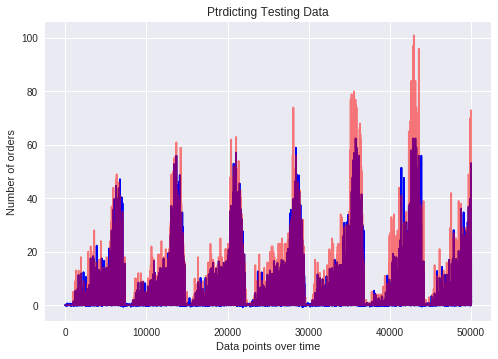

In [0]:
import xgboost as xgb
xgdmat=xgb.DMatrix(train_features,train_target)
our_params={'eta':0.3,'seed':0,'subsample':1,'colsample_bytree':1,'objective':'reg:linear','max_depth':100,'min_child_weight':20}
final_gb=xgb.train(our_params,xgdmat)
tesdmat=xgb.DMatrix(test_features)
y_pred=final_gb.predict(tesdmat)

print ("Test Mean Squear Error (MSE): "+ str( ((y_pred-test_target)*(y_pred-test_target)).mean() ))

# figure(2)
plt.plot(y_pred)
plt.plot(y_pred,'-',color='blue')
plt.plot(test_target,'c',color='red', alpha=0.5)
plt.title("Ptrdicting Testing Data")
plt.xlabel("Data points over time")
plt.ylabel("Number of orders")
plt.show()

##SKLearn ANN (Better Models than the others)
Scikit Learn package is used instead of TensorFlow, as the midel runs faster (weirdly!), and it is easy to use.

###1st Neural network
with 2 hidden layers (150, 150), with acitivation.

Test Mean Squear Error (MSE): 8.147333434779537


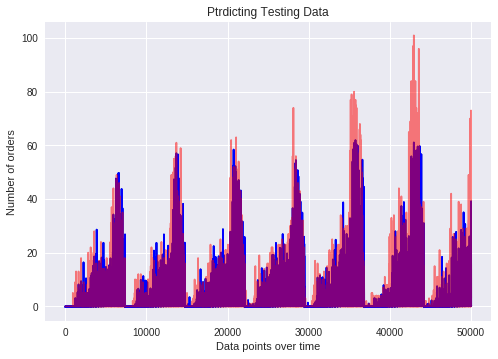

In [0]:
#@title Neural-Network with 2 hidden layers (150, 150), with acitivation = logistic :  -(double click to show the code)
n= (150,150)

model1 = sk.neural_network.MLPRegressor(hidden_layer_sizes=n, activation='logistic', solver='adam', max_iter = 200)
model1.fit(train_features, train_target)

predictions_m1 = model1.predict(test_features)
print ("Test Mean Squear Error (MSE): "+ str( ((predictions_m1-test_target)*(predictions_m1-test_target)).mean() ))

# figure(2)
plt.plot(predictions_m1)
plt.plot(predictions_m1,'-',color='blue')
plt.plot(test_target,'c',color='red', alpha=0.5)
plt.title("Ptrdicting Testing Data")
plt.xlabel("Data points over time")
plt.ylabel("Number of orders")
plt.show()

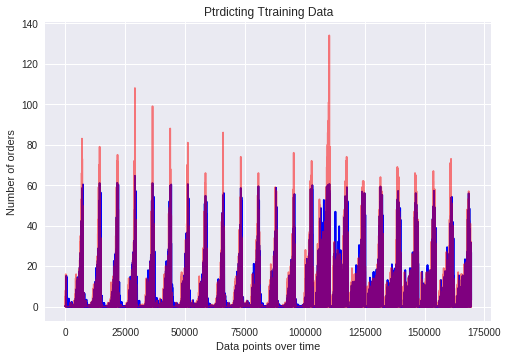

In [0]:
#@title Prediction on training data, to observe if is is overfitting:

predictions_m12 = model1.predict(train_features)

# figure
plt.plot(predictions_m12)
plt.plot(predictions_m12,'-',color='blue')
plt.plot(train_target,'c',color='red', alpha=0.5)
plt.title("Ptrdicting Ttraining Data")
plt.xlabel("Data points over time")
plt.ylabel("Number of orders")
plt.show()

###2nd Neural Network
with 3 hidden layers (70, 80, 70) and ReLU activiation function

Test Mean Squear Error (MSE): 8.140323595464729


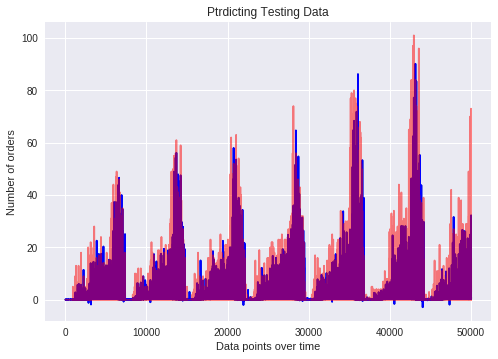

In [0]:
# @title Neural Netwoek with 3 hidden layers (70, 80, 70) and ReLU activiation function: -(double click to show the code)

n= (120,70,70)

actv = 'relu'
model2 = sk.neural_network.MLPRegressor(hidden_layer_sizes=n, activation= actv, solver='adam', max_iter = 300)
model2.fit(train_features, train_target)



predictions_m2 = model2.predict(test_features)
print ("Test Mean Squear Error (MSE): "+ str( ((predictions_m2-test_target)*(predictions_m2-test_target)).mean() ))


# figure
plt.plot(predictions_m2)
plt.plot(predictions_m2,'-',color='blue')
plt.plot(test_target,'c',color='red', alpha=0.5)
plt.title("Ptrdicting Testing Data")
plt.xlabel("Data points over time")
plt.ylabel("Number of orders")
plt.show()

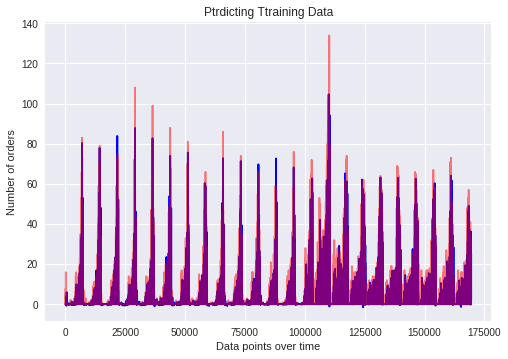

In [0]:
#@title Prediction on training data, to observe if is is overfitting:

predictions_m22 = model2.predict(train_features)

# figure
plt.plot(predictions_m22)
plt.plot(predictions_m22,'-',color='blue')
plt.plot(train_target,'c',color='red', alpha=0.5)
plt.title("Ptrdicting Ttraining Data")
plt.xlabel("Data points over time")
plt.ylabel("Number of orders")
plt.show()

###3rd Neural Network
with 3 hidden layers (100,70,120), with identity activation function

Test Mean Squear Error (MSE): 8.117089011633109


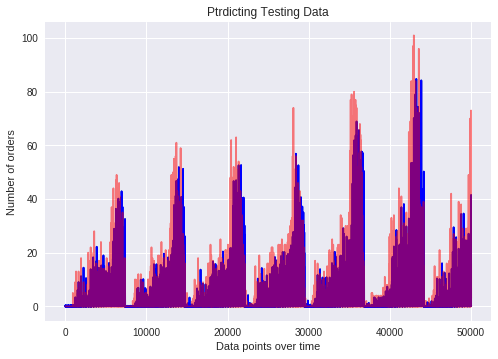

In [0]:
# @title Neural Netwoek with 3 hidden layers (100,70,120), with identity activation function: -(double click to show the code)

n=(200,120,120)

model3 = sk.neural_network.MLPRegressor(hidden_layer_sizes=n, activation='identity', solver='adam', max_iter = 300)
model3.fit(train_features, train_target)


predictions_m3 = model3.predict(test_features)
print ("Test Mean Squear Error (MSE): "+ str(((predictions_m3-test_target)*(predictions_m3-test_target)).mean()))

# figure
plt.plot(predictions_m3)
plt.plot(predictions_m3,'-',color='blue')
plt.plot(test_target,'c',color='red', alpha=0.5)
plt.title("Ptrdicting Testing Data")
plt.xlabel("Data points over time")
plt.ylabel("Number of orders")
plt.show()

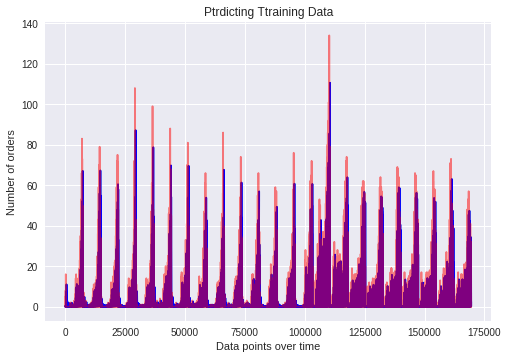

In [0]:
#@title Prediction on training data, to observe if is is overfitting:

predictions_m32 = model3.predict(train_features)

# figure
plt.plot(predictions_m32)
plt.plot(predictions_m32,'-',color='blue')
plt.plot(train_target,'c',color='red', alpha=0.5)
plt.title("Ptrdicting Ttraining Data")
plt.xlabel("Data points over time")
plt.ylabel("Number of orders")
plt.show()

## Visualize prediction reults:

In [0]:
# @title Chose the block number to show the predictions for that block { run: "auto" }
block_number = 179 #@param {type:"slider", min:0, max:307, step:1}

bbb = blockNum[block_number]

iddxx= MainDF3.index[MainDF3['block']== bbb ]

features_slice =features.loc[iddxx]
target_sliced = target.loc[iddxx]


pred = model1.predict(features_slice)

plt.subplot(1, 1, 1)
plt.plot(pred,'-',color='blue')
plt.plot(target_sliced.values,'c',color='red', alpha=0.5)
plt.title("Ptrdictions on Model 1")
plt.xlabel("Hours")
plt.ylabel("Number of orders")
plt.show()


pred = model2.predict(features_slice)
  
plt.subplot(1, 1, 1)
plt.plot(pred,'-',color='blue')
plt.plot(target_sliced.values,'c',color='red', alpha=0.5)
plt.title("Ptrdictions on Model 2")
plt.xlabel("Hours")
plt.ylabel("Number of orders")
plt.show()



pred = model3.predict(features_slice)
  
plt.subplot(1, 1, 1)
plt.plot(pred,'-',color='blue')
plt.plot(target_sliced.values,'c',color='red', alpha=0.5)
plt.title("Ptrdictions on Model 3")
plt.xlabel("Hours")
plt.ylabel("Number of orders")
plt.show()

In [0]:
# Make features:
pd1 = model1.predict(train_features)
pd2 = model2.predict(train_features)
pd3 = model3.predict(train_features)
pd4 = pd1**2
pd5 = pd2**2
pd6 = pd3**2
FX = pd.DataFrame([(pd1[i], pd2[i], pd3[i], pd4[i], pd5[i], pd6[i]) for i in range(len(pd3))])

pdt1 = model1.predict(test_features)
pdt2 = model2.predict(test_features)
pdt3 = model3.predict(test_features)
pdt4 = pdt1**2
pdt5 = pdt2**2
pdt6 = pdt3**2
FX_test = pd.DataFrame([(pdt1[i], pdt2[i], pdt3[i], pdt4[i], pdt5[i], pdt6[i]) for i in range(len(pdt3))])


Test Mean Squear Error (MSE): 8.217648785279597


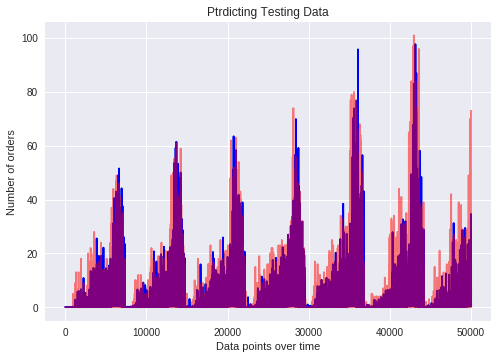

In [0]:
modelX = sk.neural_network.MLPRegressor(hidden_layer_sizes=(10,10), activation='relu', solver='adam', max_iter = 250)
modelX.fit(FX, train_target)

predictions_mX = modelX.predict(FX_test)
print ("Test Mean Squear Error (MSE): "+ str(((predictions_mX-test_target)*(predictions_mX-test_target)).mean()))

# figure
plt.plot(predictions_mX)
plt.plot(predictions_mX,'-',color='blue')
plt.plot(test_target,'c',color='red', alpha=0.5)
plt.title("Ptrdicting Testing Data")
plt.xlabel("Data points over time")
plt.ylabel("Number of orders")
plt.show()

Test Mean Squear Error (MSE): 8.11927576754386


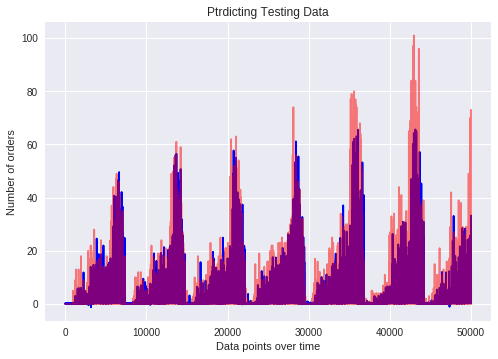

##TF ANN
Attempting to use TensorFlow to build a Neural-Netwoek model.
It is disregarded because it was slower to run than other models, takin up alot of time to optimise the model.

In [0]:
def build_model():
  model = keras.Sequential([
    layers.Dense(70, activation=tf.nn.tanh, input_shape=[train_features.shape[1]]),
    layers.Dense(50, activation=tf.nn.tanh),
    layers.Dense(1)
  ])

  optimizer = tf.train.RMSPropOptimizer(0.001)

  model.compile(loss='mse',
                optimizer=optimizer,
                metrics=['mae', 'mse'])
  return model

model = build_model()


# Run the model on TPU to speed up the processing.

# tpu_model = tf.contrib.tpu.keras_to_tpu_model( model, strategy=tf.contrib.tpu.TPUDistributionStrategy(
#         tf.contrib.cluster_resolver.TPUClusterResolver(TPU_WORKER)))


# Display training progress by printing a single dot for each completed epoch
class PrintDot(keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs):
    if epoch % 100 == 0: print('')
    print('.',end='')
    

EPOCHS = 200

history = model.fit( train_features, train_target, epochs=EPOCHS, validation_split = 0.2, verbose=0,  callbacks=[PrintDot()])


test_predictions = model.predict(test_features).flatten()
print ("Test average orders: ",end='')
print (str(test_target.sum()/len(test_predictions)))
print ("Test mean error: "+ str((abs(test_predictions-test_target)).sum()/len(test_predictions)) )
print ("Test Mean Squear Error (MSE): "+ str(((test_predictions-test_target)*(test_predictions-test_target)).sum()/len(test_predictions)))

# figure(2)
plt.plot(test_predictions)
plt.plot(test_predictions,'-',color='blue')
plt.plot(test_target,'c',color='red', alpha=0.5)
plt.show()

In [0]:
# initialize TPU for use with google colab when runtime type is TPU.
TPU_WORKER = 'grpc://' + os.environ['COLAB_TPU_ADDR']
tf.logging.set_verbosity(tf.logging.INFO)

##SVM
We can se that the SVM's  performance is not even comparable to the ANN's

/usr/local/lib/python2.7/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


Test average orders: 1
Test mean error: 1.4406426632063478
Test Mean Squear Error (MSE): 11.125927668525813


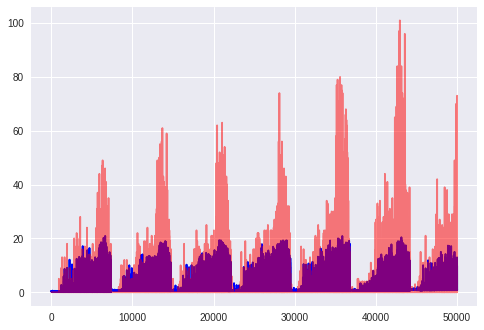

In [0]:
from sklearn import svm

clf = svm.SVR(C=0.20)
clf.fit(train_features, train_target)
# SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
#     gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
#     tol=0.001, verbose=False)

predictions2 = clf.predict(test_features)

print ("Test average orders: ",end='')
print (str(test_target.sum()/len(predictions2)))
print ("Test mean error: "+ str((abs(predictions2-test_target)).sum()/len(predictions2)) )
print ("Test Mean Squear Error (MSE): "+ str(((predictions2-test_target)*(predictions2-test_target)).sum()/len(predictions2)))


plt.plot(predictions2)
plt.plot(predictions2,'-',color='blue')
plt.plot(test_target,'c',color='red', alpha=0.5)
plt.show()

#Scratch

In [0]:
try:
  device_name = os.environ['COLAB_TPU_ADDR']
  TPU_ADDRESS = 'grpc://' + device_name
  print('Found TPU at: {}'.format(TPU_ADDRESS))

except KeyError:
  print('TPU not found')

Found TPU at: grpc://10.83.239.2:8470


In [0]:
# import gmplot package 
import gmplot 
  
gmap3 = gmplot.GoogleMapPlotter(24.5997234, 46.8067974 , 11) 
  
# scatter method of map object  
# scatter points on the google map 
long2=long+12.7
gmap3.heatmap( lat, long2 ) 
  
# Plot method Draw a line in 
# between given coordinates 
# gmap3.heatmap(latitude_list, longitude_list),# 'cornflowerblue', edge_width = 2.5) 
  
gmap3.draw( "map13.html" ) 

In [0]:
from IPython.core.display import display, HTML
from IPython.display import HTML
from IPython.display import IFrame

display(HTML(filename='map1.html'))#name)
# IFrame(src="map.html", width=700, height=600)
# IFrame(src="my_map.html", width=700, height=600)
# IFrame(src="ss.html", width=700, height=600)


In [0]:
%cd ./
!ls


/content
sample_data  task-data.csv


Test average orders: 1
Train mean error: 0.7140193645798689
Train Mean Squear Error (MSE): 3.343963530289229


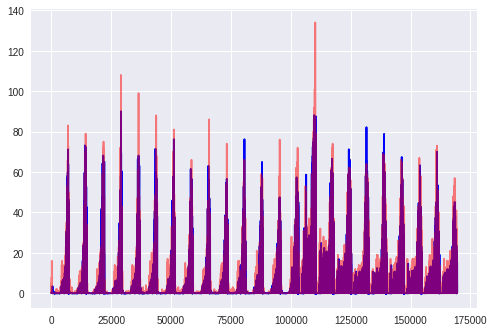

In [0]:
#prediction on train data, to observe if is is overfitting:

predictions = model.predict(train_features)
# model.score(predictions, train_target)
print ("Test average orders: "+ str(train_target.sum()/len(train_target)))
print ("Train mean error: "+ str((abs(predictions-train_target)).sum()/len(predictions)))
print ("Train Mean Squear Error (MSE): "+ str(((predictions-train_target)*(predictions-train_target)).sum()/len(predictions)))

# figure(1)
plt.plot(predictions)
plt.plot(predictions,'-',color='blue')
plt.plot(train_target,'c',color='red', alpha=0.5)
plt.show()